# Rapport VISORD TP2

In [1]:
%matplotlib inline

import cv2
import numpy as np
import os
import scipy.io

from itertools import izip
import IPython.html.widgets as widgets
from IPython.display import display

from matplotlib import rcParams
from matplotlib import pyplot as plt
from matplotlib.widgets import Slider

PATH = "img"
IMAGES = [
    os.path.join(PATH, img)
    for img in os.listdir(PATH)
    if os.path.isfile(os.path.join(PATH, img)) and img[-3:] == 'jpg'
]
SEGFILES = [
    os.path.join(PATH, img)
    for img in os.listdir(PATH)
    if os.path.isfile(os.path.join(PATH, img)) and img[-3:] == 'seg'
]
MATFILES = [
    os.path.join(PATH, img)
    for img in os.listdir(PATH)
    if os.path.isfile(os.path.join(PATH, img)) and img[-3:] == 'mat'
]

CANNY_LOW = 100
CANNY_HIGH = 250

rcParams["figure.max_open_warning"] = 0  # remove limit on figure number

:0: FutureWarning: IPython widgets are experimental and may change in the future.


## 1 - Détection de contour

### Évaluation quantitative des détecteurs

#### Les fonctions utilitaires

In [2]:
def _plot(img, title="", gray=False):
    if gray:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img)
    plt.subplots_adjust(left=0.0, right=2.0, bottom=0.0, top=2.0)
    plt.title(title)
    plt.xticks([])
    plt.yticks([])

def plot_one(img, title="", gray=False):
    plt.figure()
    _plot(img, "", gray)
    
def plot_by_pair(images, titles=["", ""], gray=False):
    plt.figure()
    plt.subplot(121)
    _plot(images[0], titles[0], gray)
    plt.subplot(122)
    _plot(images[1], titles[1], gray)

#### 1- Calcul du gradient et seuillage

Pour déterminer les seuils optimaux, il suffit de tester des valeurs avec les sliders ci-dessous. Ceux-ci mettent à jour les valeurs dynamiquement et il suffit de builder la suite pour mettre à jour les filtres

PS : il est conseillé de mettre directement à jour les valeurs numériques à droite des sliders qui peuvent être gourmant en temps de calcul

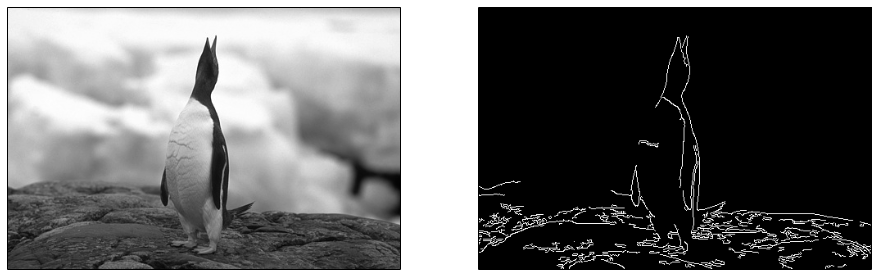

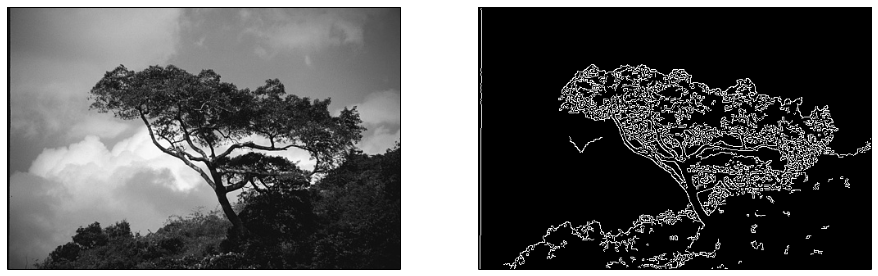

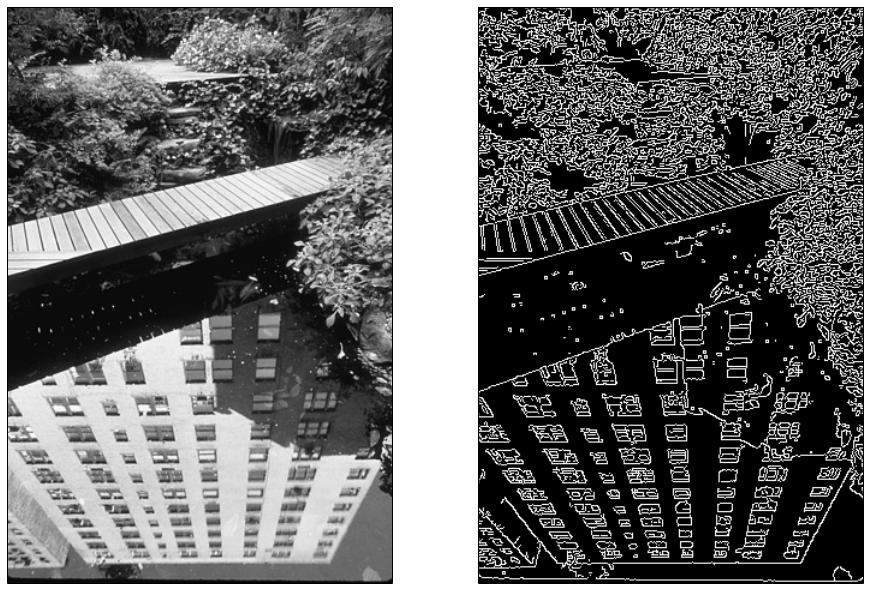

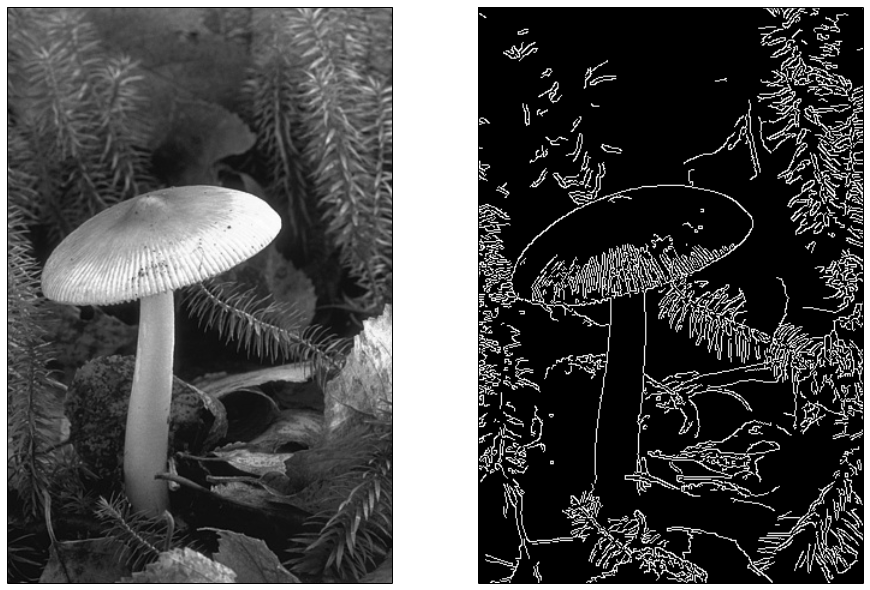

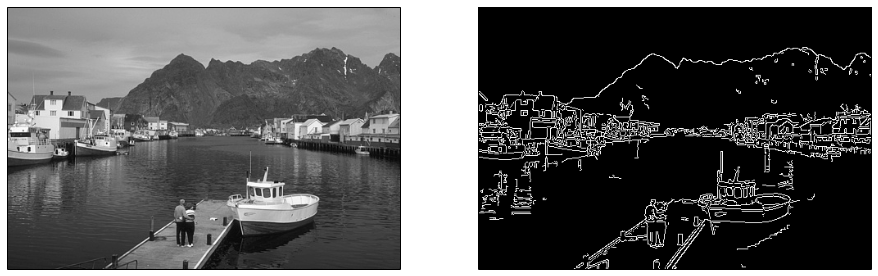

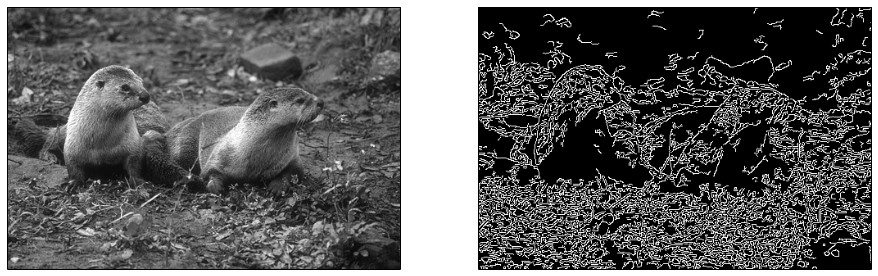

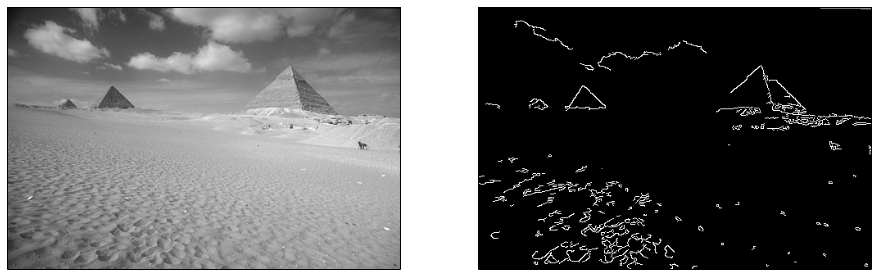

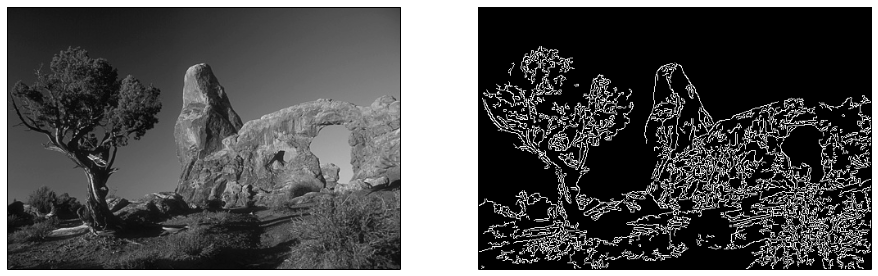

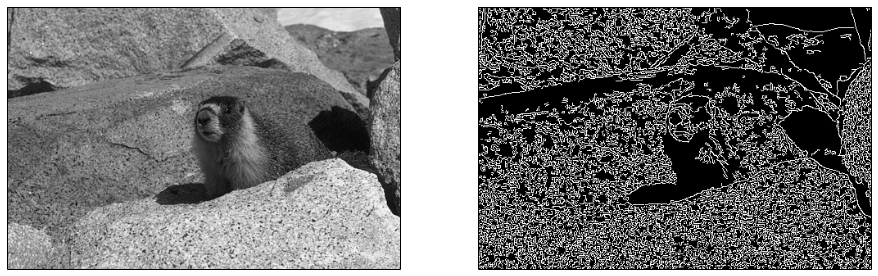

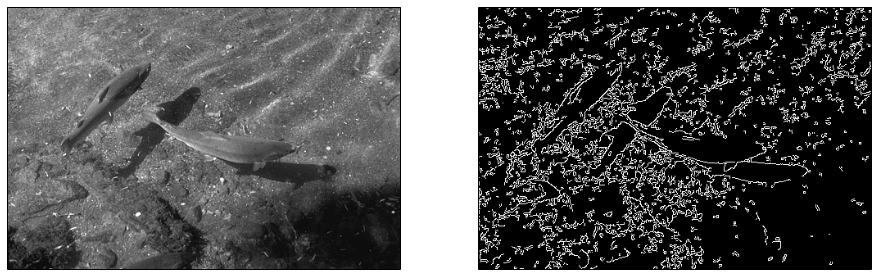

In [3]:
def callback_slider(low=CANNY_LOW, high=CANNY_HIGH):
    CANNY_LOW = low
    CANNY_HIGH = high
    
    for path in IMAGES:
        img = cv2.imread(path, 0)
        canny = cv2.Canny(img, CANNY_LOW, CANNY_HIGH)
        plot_by_pair([img, canny], gray=True)

low_slider = widgets.IntSlider(min=0, max=500, step=10, value=CANNY_LOW)
high_slider = widgets.FloatSlider(min=0, max=500, step=10, value=CANNY_HIGH)
sliders = widgets.interactive(callback_slider, low=low_slider, high=high_slider)
display(sliders)

#### 2- Comparaison avec segmentation manuelle

In [4]:
def dict_from_seg(segfile):
    """
    Extract data from seg file and returns a dict
    """
    f = open(segfile)
    result = {}
    for line in f.readlines():
        line = line.replace("\n", "")
        try:
            # first char is int : this is a point data
            point = map(int, line.split(" "))
            if type(result["data"]) != list:
                result["data"] = []
            result["data"].append(point)
        except ValueError:
            # first char is string : this is header info
            split = line.split(" ")
            result[split[0]] = " ".join(split[1:])

    return result

##### Les images

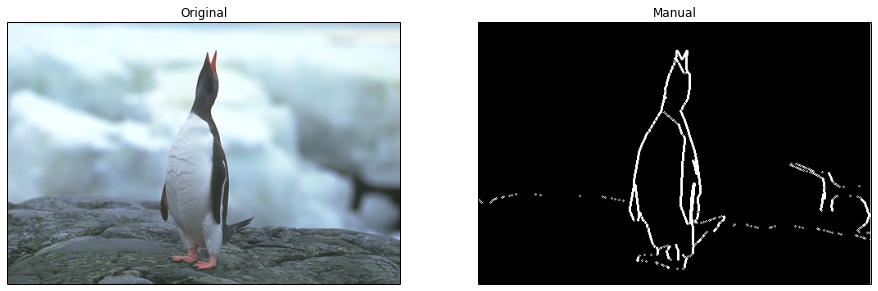

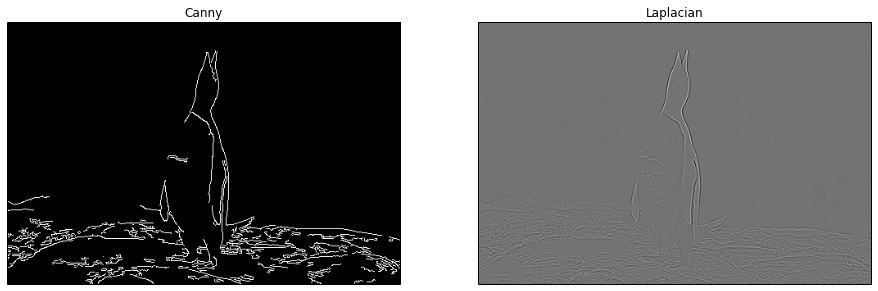

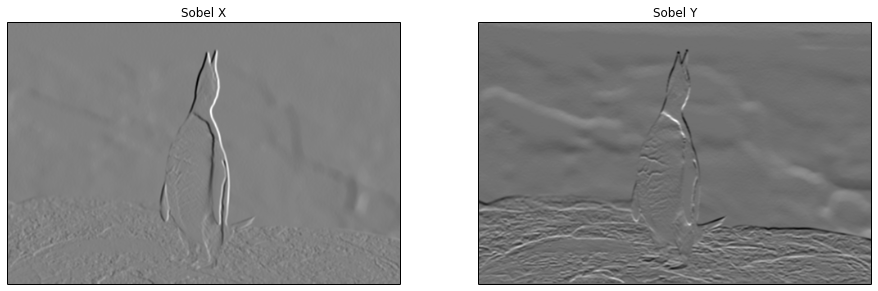

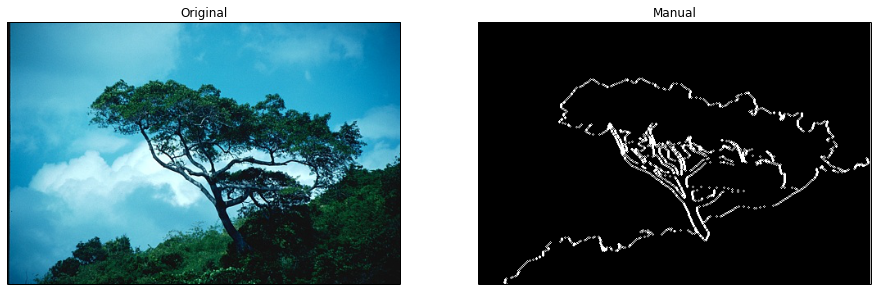

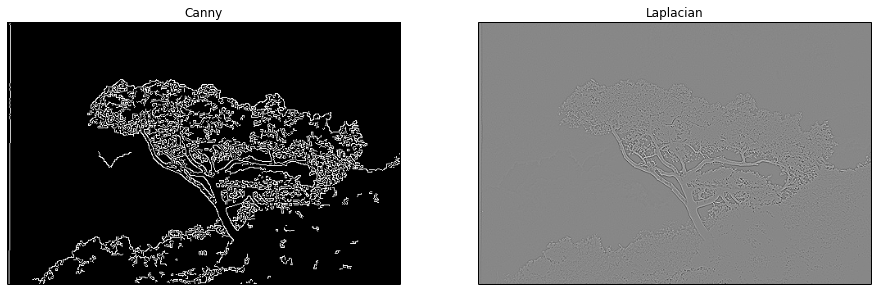

...

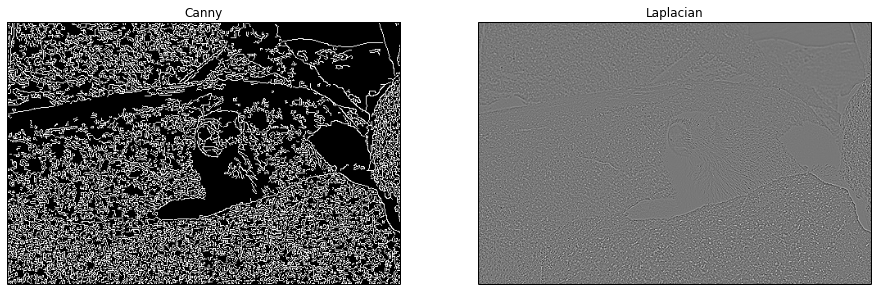

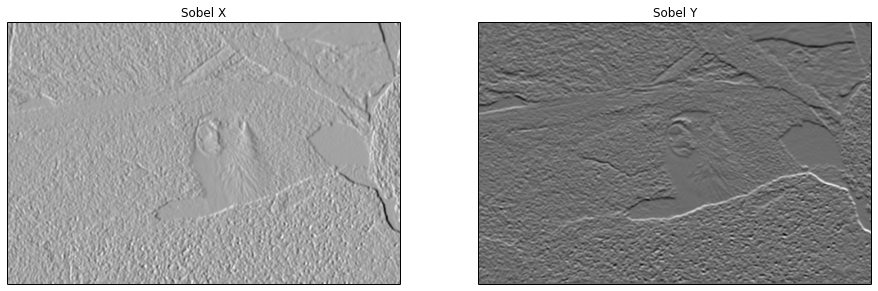

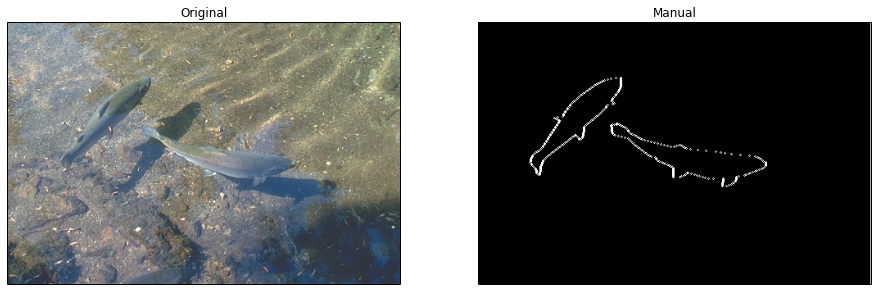

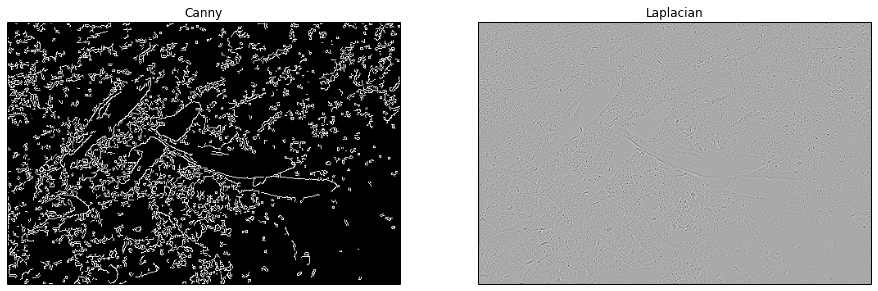

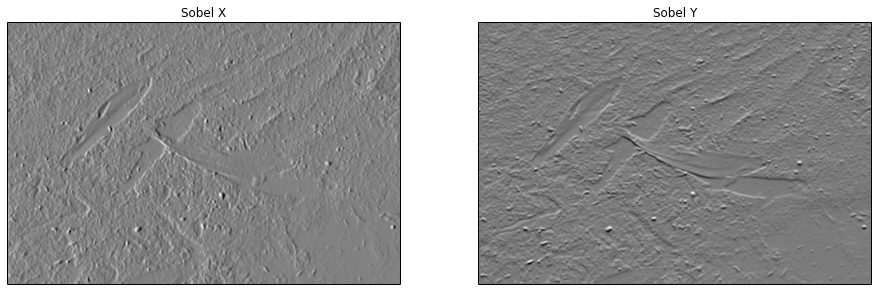

In [5]:
for path in IMAGES:
    human = dict_from_seg(path.replace("jpg", "seg"))
    img = cv2.imread(path, 0)
    manual_seg = np.zeros(img.shape, np.uint8)
    
    for point in human["data"]:
        cv2.circle(manual_seg, (point[3], point[1]), 1, (255, 255, 255))

    canny = cv2.Canny(img, CANNY_LOW, CANNY_HIGH)
    laplacian = cv2.Laplacian(img, cv2.CV_64F)
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
    
    plot_by_pair([cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB), manual_seg], ["Original", "Manual"], gray=True)
    plot_by_pair([canny, laplacian], ["Canny", "Laplacian"], gray=True)
    plot_by_pair([sobelx, sobely], ["Sobel X", "Sobel Y"], gray=True)

##### Comparaison des performances

In [6]:
mat = scipy.io.loadmat('img/147091.mat')
x = mat['groundTruth']
plt.imshow(x.astype(float))

ValueError: setting an array element with a sequence.